In [1]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 55.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: n

In [2]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 78.7 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

2025-11-15 15:23:50.294322: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763220230.538168      48 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763220230.604189      48 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [4]:
dataset_path_rgn = "/kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-1.8782, -1.5357, -1.6042,  ..., -0.5596, -0.6109, -0.6281],
         [-1.5699, -1.6898, -1.6384,  ..., -0.5767, -0.5938, -0.5938],
         [-1.4329, -1.9295, -1.7412,  ..., -0.5938, -0.5596, -0.5424],
         ...,
         [-1.1075, -1.2103, -1.4500,  ..., -0.4054, -0.0801, -0.4226],
         [-1.2788, -1.3644, -1.3987,  ..., -0.0287,  0.3138,  0.3309],
         [-1.7583, -1.8610, -1.7412,  ..., -0.0629,  0.0398,  0.1254]],

        [[-1.5105, -1.1604, -1.2304,  ..., -0.7577, -0.7577, -0.7752],
         [-1.1954, -1.3179, -1.2654,  ..., -0.7752, -0.7402, -0.7402],
         [-1.0553, -1.5630, -1.3704,  ..., -0.7927, -0.7577, -0.7402],
         ...,
         [-0.7752, -0.8803, -1.1253,  ..., -0.2500,  0.0826, -0.2675],
         [-0.9503, -1.0378, -1.0728,  ...,  0.1352,  0.4853,  0.5028],
         [-1.4405, -1.5455, -1.4230,  ...,  0.1001,  0.2052,  0.2927]],

        [[-1.4733, -1.1247, -1.1944,  ..., -0.6018, -0.6193, -0.6367],
         [-1.1596, -1.2816, -1.2293,  ..., -0

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [21]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3, self).__init__()
        self.base_model = smp.DeepLabV3(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

In [23]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [24]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [25]:
!pip install optuna

In [26]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [27]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [28]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-15 15:24:30,272] A new study created in memory with name: no-name-51dff976-c6ac-489d-b805-295da68fbef9


Trial 0: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:15<00:00,  1.20it/s]


Epoch 1/25:
Train loss: 0.1697376767794291, Train Avg IoU: 0.48075185377372215



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.14342753092447916, Val Avg IoU: 0.5572701181237244



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 2/25:
Train loss: 0.14775735098454687, Train Avg IoU: 0.604773684550286



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.12159538269042969, Val Avg IoU: 0.707772428563522



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 3/25:
Train loss: 0.13082270117269623, Train Avg IoU: 0.6985549077401498



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.11151222139596939, Val Avg IoU: 0.7617648187452697



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 4/25:
Train loss: 0.12123579159379005, Train Avg IoU: 0.7486311424425006



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.1100320170323054, Val Avg IoU: 0.7314988910333865



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 5/25:
Train loss: 0.11592744166652362, Train Avg IoU: 0.756876784191349



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.09500882029533386, Val Avg IoU: 0.8207002937669247



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 6/25:
Train loss: 0.11150684994128016, Train Avg IoU: 0.7603472813096325



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.10045378406842549, Val Avg IoU: 0.772193530753411



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 7/25:
Train loss: 0.10786163599954711, Train Avg IoU: 0.770633702280457



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.09177223841349284, Val Avg IoU: 0.8176079141714832



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 8/25:
Train loss: 0.10329855523175663, Train Avg IoU: 0.789284669033872



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.09139088541269302, Val Avg IoU: 0.8192969318197659



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 9/25:
Train loss: 0.1000652445687188, Train Avg IoU: 0.800252422807874



100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


Val loss: 0.08983254184325536, Val Avg IoU: 0.820827934327972



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 10/25:
Train loss: 0.09919471542040507, Train Avg IoU: 0.8016586166719888



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.08631918330987294, Val Avg IoU: 0.8322260753952159



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 11/25:
Train loss: 0.09425990656018257, Train Avg IoU: 0.8096868795690739



100%|██████████| 3/3 [00:00<00:00,  3.13it/s]


Val loss: 0.08461109797159831, Val Avg IoU: 0.8371744144213028



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 12/25:
Train loss: 0.09672243065304226, Train Avg IoU: 0.8022572203190738



100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


Val loss: 0.08684857686360677, Val Avg IoU: 0.8212861958797634



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 13/25:
Train loss: 0.09446174403031667, Train Avg IoU: 0.8107834424373094



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.08261738965908687, Val Avg IoU: 0.8395799601018124



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 14/25:
Train loss: 0.09365481096837255, Train Avg IoU: 0.807406218928893



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.0821915293733279, Val Avg IoU: 0.8394962317229622



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 15/25:
Train loss: 0.09359783141149415, Train Avg IoU: 0.8153305475834923



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.08271785577138265, Val Avg IoU: 0.833394832655937



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 16/25:
Train loss: 0.09458617659078704, Train Avg IoU: 0.8192453425568667



100%|██████████| 3/3 [00:00<00:00,  3.10it/s]


Val loss: 0.08056735495726268, Val Avg IoU: 0.8430118939663752



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 17/25:
Train loss: 0.09246480009622043, Train Avg IoU: 0.8212342777697716



100%|██████████| 3/3 [00:00<00:00,  3.15it/s]


Val loss: 0.08286135643720627, Val Avg IoU: 0.828851729996785



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 18/25:
Train loss: 0.09073104419642025, Train Avg IoU: 0.8232539050931897



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.08103470504283905, Val Avg IoU: 0.8368557616916958



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 19/25:
Train loss: 0.09076410325037108, Train Avg IoU: 0.8252239958495887



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.08008940269549687, Val Avg IoU: 0.842120453474863



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 20/25:
Train loss: 0.08816017003522979, Train Avg IoU: 0.8279237028337363



100%|██████████| 3/3 [00:00<00:00,  3.10it/s]


Val loss: 0.07937843600908916, Val Avg IoU: 0.8448238369336277



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 21/25:
Train loss: 0.09008261354433166, Train Avg IoU: 0.8279567165944884



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.07956875363985698, Val Avg IoU: 0.8427203561349931



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 22/25:
Train loss: 0.08934029978182581, Train Avg IoU: 0.8262919802079801



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.07952879617611568, Val Avg IoU: 0.8430520682055502



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 23/25:
Train loss: 0.08727490819162792, Train Avg IoU: 0.8291268640315499



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.07942543923854828, Val Avg IoU: 0.8440070838789975



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 24/25:
Train loss: 0.08802838582131597, Train Avg IoU: 0.8312102176913525



100%|██████████| 3/3 [00:00<00:00,  3.16it/s]


Val loss: 0.07951898376146953, Val Avg IoU: 0.8435369542989729



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 25/25:
Train loss: 0.0879502043955856, Train Avg IoU: 0.8319512167921528



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]
[I 2025-11-15 15:30:44,796] Trial 0 finished with value: 0.07937843600908916 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.07937843600908916.


Val loss: 0.0795157899459203, Val Avg IoU: 0.8435618940114337

Trial 1: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 1/25:
Train loss: 0.16930296023686728, Train Avg IoU: 0.5022674365192001



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.14403357108434042, Val Avg IoU: 0.5749927919506438



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 2/25:
Train loss: 0.1513616939385732, Train Avg IoU: 0.5871205454756517



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.13451853394508362, Val Avg IoU: 0.5897944111923134



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 3/25:
Train loss: 0.13368862660394776, Train Avg IoU: 0.6851500588643898



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.11276599516471227, Val Avg IoU: 0.7544896784173427



100%|██████████| 18/18 [00:14<00:00,  1.29it/s]


Epoch 4/25:
Train loss: 0.12709442526102066, Train Avg IoU: 0.7035280823810086



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.10928543408711751, Val Avg IoU: 0.7603478175250203



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 5/25:
Train loss: 0.1162989739742544, Train Avg IoU: 0.7583937648298961



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.10060137261946996, Val Avg IoU: 0.7990090724568509



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 6/25:
Train loss: 0.10901932915051778, Train Avg IoU: 0.7893547903818696



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.09375689178705215, Val Avg IoU: 0.8246266026682054



100%|██████████| 18/18 [00:13<00:00,  1.30it/s]


Epoch 7/25:
Train loss: 0.1082401755783293, Train Avg IoU: 0.7875111018786723



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.09310534844795863, Val Avg IoU: 0.8203748940670449



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 8/25:
Train loss: 0.1017503866718875, Train Avg IoU: 0.808610276994106



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.08936591198047002, Val Avg IoU: 0.8320714439136937



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 9/25:
Train loss: 0.10231806544793977, Train Avg IoU: 0.8004013221441544



100%|██████████| 3/3 [00:01<00:00,  2.98it/s]


Val loss: 0.08792355159918468, Val Avg IoU: 0.8341424111899824



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 10/25:
Train loss: 0.1029554878671964, Train Avg IoU: 0.7932464064210758



100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


Val loss: 0.0907503142952919, Val Avg IoU: 0.810503764178641



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 11/25:
Train loss: 0.10257465433743265, Train Avg IoU: 0.7827274509360552



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.08670213570197423, Val Avg IoU: 0.8295456635455848



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 12/25:
Train loss: 0.09654348136650191, Train Avg IoU: 0.8132099416716407



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.08383248498042424, Val Avg IoU: 0.8350775680777333



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 13/25:
Train loss: 0.09995561631189452, Train Avg IoU: 0.7895355347714799



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.08523642023404439, Val Avg IoU: 0.8234085331013162



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 14/25:
Train loss: 0.09647132870223787, Train Avg IoU: 0.7952327081905968



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]


Val loss: 0.08366205543279648, Val Avg IoU: 0.82756325805879



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 15/25:
Train loss: 0.09370818527208434, Train Avg IoU: 0.8176171670013185



100%|██████████| 3/3 [00:01<00:00,  2.98it/s]


Val loss: 0.07986651609341304, Val Avg IoU: 0.8392864519443175



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 16/25:
Train loss: 0.09358669651879205, Train Avg IoU: 0.8042179689515155



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.0774482289950053, Val Avg IoU: 0.84444835454835



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 17/25:
Train loss: 0.08849812671542168, Train Avg IoU: 0.8235511888943439



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.07718924929698308, Val Avg IoU: 0.8423619994885568



100%|██████████| 18/18 [00:14<00:00,  1.28it/s]


Epoch 18/25:
Train loss: 0.08759433589875698, Train Avg IoU: 0.8226781188846273



100%|██████████| 3/3 [00:00<00:00,  3.07it/s]


Val loss: 0.07610016564528148, Val Avg IoU: 0.8438294189256667



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 19/25:
Train loss: 0.0842477600607607, Train Avg IoU: 0.8307778049163168



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.07416719694932301, Val Avg IoU: 0.8464093947030712



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 20/25:
Train loss: 0.09356293868687418, Train Avg IoU: 0.7878769443164204



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.08529597520828247, Val Avg IoU: 0.804261563269627



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 21/25:
Train loss: 0.0902393211921056, Train Avg IoU: 0.7986004262544195



100%|██████████| 3/3 [00:00<00:00,  3.00it/s]


Val loss: 0.07933938503265381, Val Avg IoU: 0.8193002124535494



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 22/25:
Train loss: 0.08628936111927032, Train Avg IoU: 0.8146614793365516



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.07484151422977448, Val Avg IoU: 0.8333540892303835



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 23/25:
Train loss: 0.08102211480339368, Train Avg IoU: 0.8240884429331747



100%|██████████| 3/3 [00:01<00:00,  2.88it/s]


Val loss: 0.07304612298806508, Val Avg IoU: 0.8381630238450436



100%|██████████| 18/18 [00:14<00:00,  1.28it/s]


Epoch 24/25:
Train loss: 0.08134324227770169, Train Avg IoU: 0.8274154369458759



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.07124824076890945, Val Avg IoU: 0.8452119070006657



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 25/25:
Train loss: 0.07897532358765602, Train Avg IoU: 0.8324201628477619



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]
[I 2025-11-15 15:37:00,579] Trial 1 finished with value: 0.06971413890520732 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 1 with value: 0.06971413890520732.


Val loss: 0.06971413890520732, Val Avg IoU: 0.8465874013282972

Trial 2: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 1/25:
Train loss: 0.17207701669798958, Train Avg IoU: 0.4753821833911662



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.14573332170645395, Val Avg IoU: 0.5793446053596795



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 2/25:
Train loss: 0.148146267566416, Train Avg IoU: 0.607596181402888



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.12462732195854187, Val Avg IoU: 0.7055665717440175



100%|██████████| 18/18 [00:14<00:00,  1.28it/s]


Epoch 3/25:
Train loss: 0.13369848620560434, Train Avg IoU: 0.6882863146188691



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.1109555462996165, Val Avg IoU: 0.7832076743267423



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 4/25:
Train loss: 0.12392750506599744, Train Avg IoU: 0.7444407772792574



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.10817356407642365, Val Avg IoU: 0.77792565834191



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 5/25:
Train loss: 0.11524149444368151, Train Avg IoU: 0.7705058254384904



100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


Val loss: 0.0999744435151418, Val Avg IoU: 0.8189992940405325



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 6/25:
Train loss: 0.11356250279479557, Train Avg IoU: 0.7866431193576371



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.09778812279303868, Val Avg IoU: 0.8234393030750636



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 7/25:
Train loss: 0.11176331672403547, Train Avg IoU: 0.779562864928115



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.10043267160654068, Val Avg IoU: 0.8031684120306933



100%|██████████| 18/18 [00:14<00:00,  1.29it/s]


Epoch 8/25:
Train loss: 0.10800795257091522, Train Avg IoU: 0.7968025760722235



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.0955650731921196, Val Avg IoU: 0.8134581429592153



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 9/25:
Train loss: 0.10547493936287032, Train Avg IoU: 0.7975880590230651



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.09301623950401942, Val Avg IoU: 0.8279739657906835



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 10/25:
Train loss: 0.10296943038702011, Train Avg IoU: 0.8088511269543103



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.09146985659996669, Val Avg IoU: 0.8334636559575311



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 11/25:
Train loss: 0.09980599044097795, Train Avg IoU: 0.8170287529970911



100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


Val loss: 0.0912871981660525, Val Avg IoU: 0.8308302870319668



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 12/25:
Train loss: 0.10167849643362893, Train Avg IoU: 0.8132693763121801



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.09114077438910802, Val Avg IoU: 0.8317471700749101



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 13/25:
Train loss: 0.10204895709951718, Train Avg IoU: 0.8055479199633991



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.08958027015129726, Val Avg IoU: 0.8374614725465891



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 14/25:
Train loss: 0.10236805594629711, Train Avg IoU: 0.8058515183421955



100%|██████████| 3/3 [00:01<00:00,  2.98it/s]


Val loss: 0.08981065452098846, Val Avg IoU: 0.8312863507683425



100%|██████████| 18/18 [00:14<00:00,  1.29it/s]


Epoch 15/25:
Train loss: 0.10145309815804164, Train Avg IoU: 0.8145655559059221



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.08906970421473186, Val Avg IoU: 0.8378458778372222



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 16/25:
Train loss: 0.09967025866111119, Train Avg IoU: 0.8177153456162387



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.08855880548556645, Val Avg IoU: 0.8374292499896955



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 17/25:
Train loss: 0.09689324059420162, Train Avg IoU: 0.8208640826292738



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.08829824129740398, Val Avg IoU: 0.8397518662802632



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 18/25:
Train loss: 0.0980759167836772, Train Avg IoU: 0.8214319663707238



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.08809978514909744, Val Avg IoU: 0.8399374722749177



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 19/25:
Train loss: 0.0976313634051217, Train Avg IoU: 0.8228276651269721



100%|██████████| 3/3 [00:00<00:00,  3.05it/s]


Val loss: 0.08813826243082683, Val Avg IoU: 0.8392231206700275



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 20/25:
Train loss: 0.09853607498937184, Train Avg IoU: 0.8217356300757201



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.08765563617149989, Val Avg IoU: 0.8401021675067438



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 21/25:
Train loss: 0.09950087923142645, Train Avg IoU: 0.8211466631130266



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]


Val loss: 0.08809582889080048, Val Avg IoU: 0.8390560502181708



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 22/25:
Train loss: 0.09551262689961328, Train Avg IoU: 0.8261756439255056



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.08768971512715022, Val Avg IoU: 0.8407261450487021



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 23/25:
Train loss: 0.09468725075324376, Train Avg IoU: 0.8236399307396467



100%|██████████| 3/3 [00:01<00:00,  3.00it/s]


Val loss: 0.0876770168542862, Val Avg IoU: 0.8391077313963752



100%|██████████| 18/18 [00:14<00:00,  1.29it/s]


Epoch 24/25:
Train loss: 0.0965858871738116, Train Avg IoU: 0.8259554842749344



100%|██████████| 3/3 [00:01<00:00,  2.96it/s]


Val loss: 0.08732590327660243, Val Avg IoU: 0.840901943293653



100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


Epoch 25/25:
Train loss: 0.0984786053498586, Train Avg IoU: 0.8205900134478509



100%|██████████| 3/3 [00:00<00:00,  3.03it/s]
[I 2025-11-15 15:43:16,533] Trial 2 finished with value: 0.08732590327660243 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 1 with value: 0.06971413890520732.


Val loss: 0.08771102627118428, Val Avg IoU: 0.8397336922892981



In [29]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}
Best val loss: 0.06971413890520732


In [30]:
fine_tune_model.eval()

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

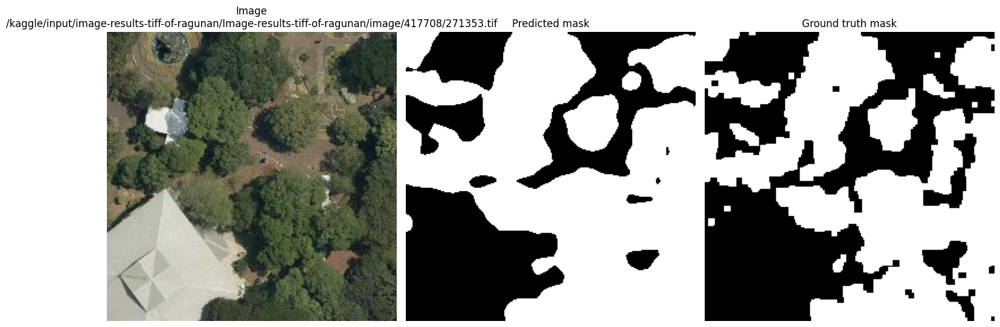

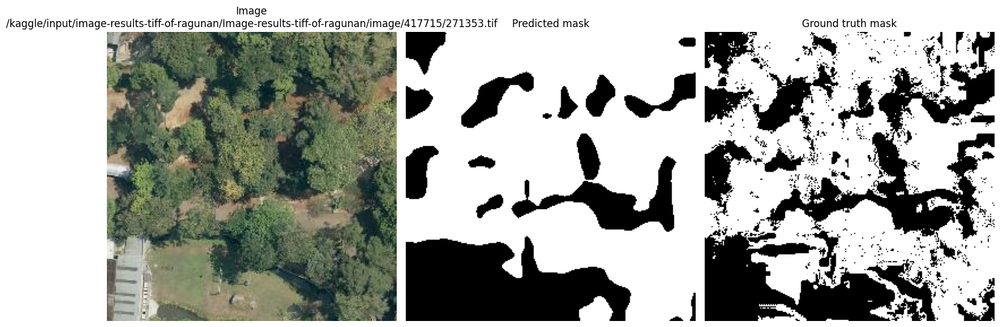

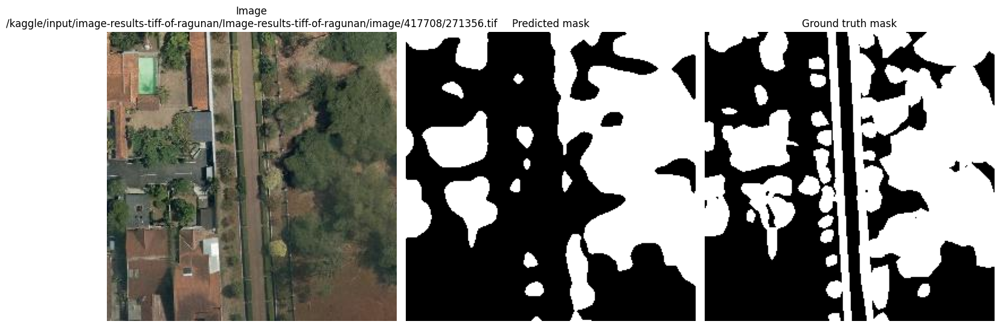

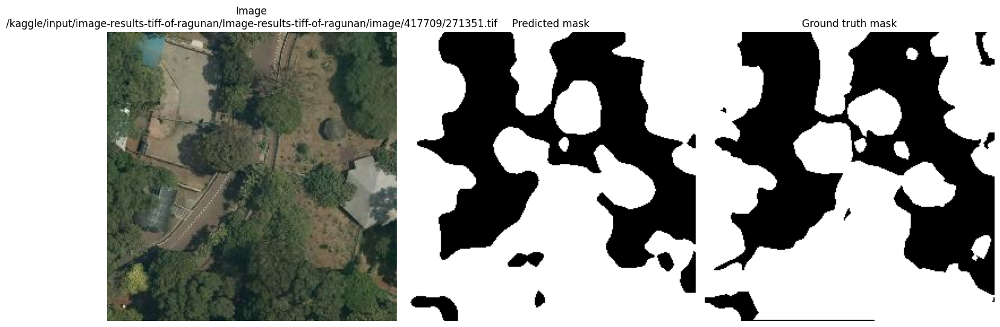

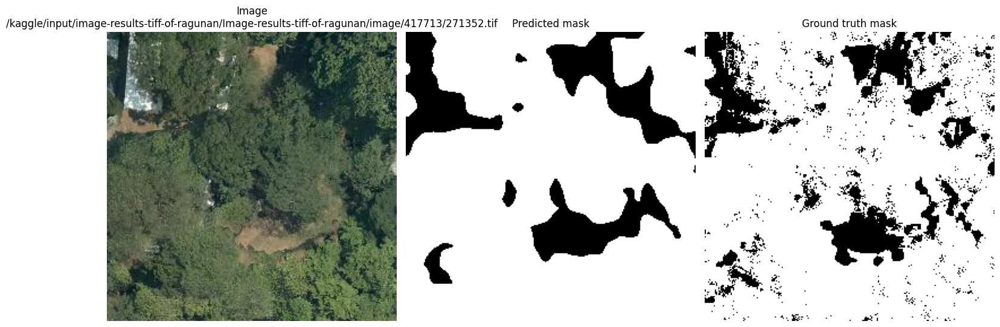

...

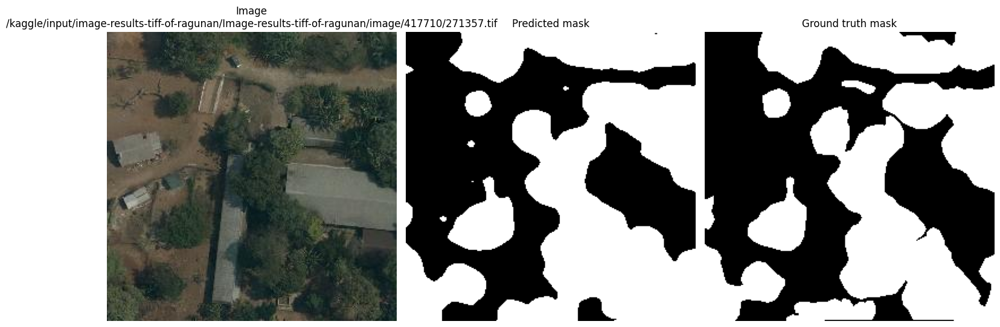

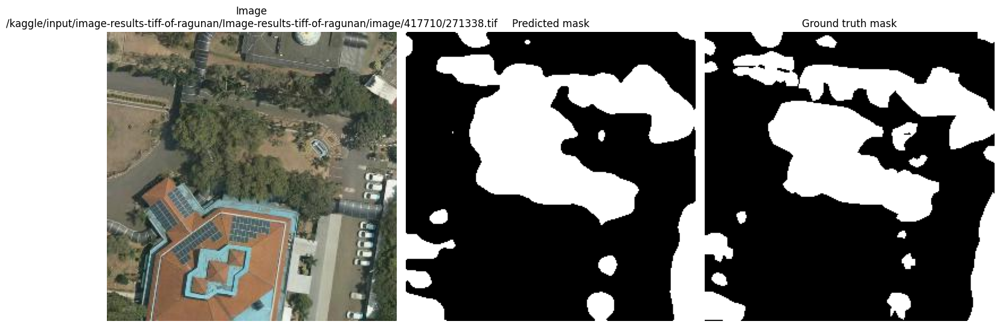

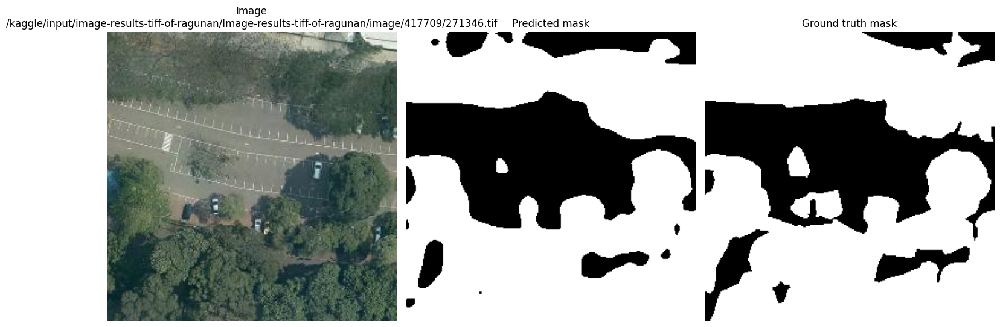

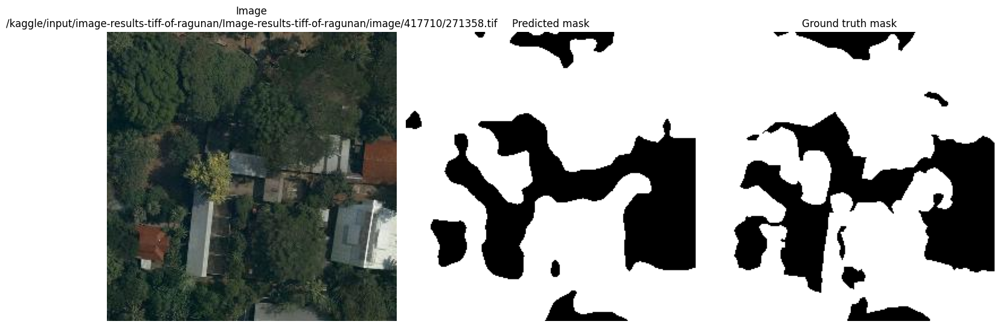

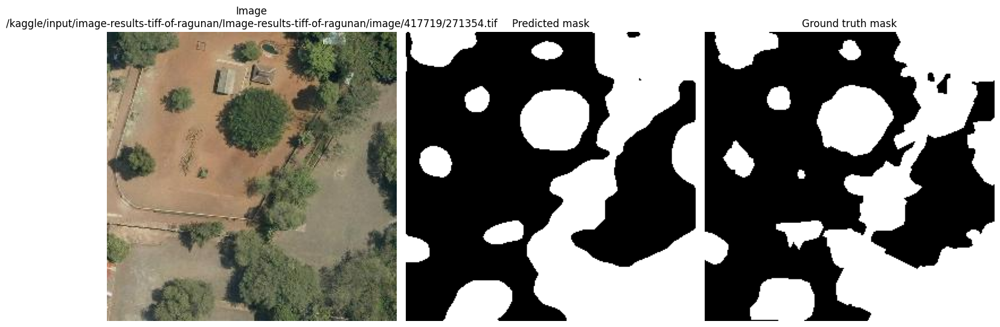

In [31]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [32]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [33]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40985
Vegetation coverage area: 23067.583982252923
IoU score: 0.8123223662026109
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 45364
Vegetation coverage area: 3525.1425266425686
IoU score: 0.746524064171123
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 26337
Vegetation coverage area: 14823.251417362333
IoU score: 0.6912567508392935
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 40331
Vegetation coverage area: 22699.493219183667
IoU score: 0.8687677171919292
Image /kaggle/input/i

In [36]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 23067.583982252923 m^2
Carbon density: 0.0071552834122820316 ton/m^2
Estimated carbon stock: 165.05510102963703 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3525.1425266425686 m^2
Carbon density: 0.0071552834122820316 ton/m^2
Estimated carbon stock: 25.22339384681554 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 14823.251417362333 m^2
Carbon density: 0.0071552834122820316 ton/m^2
Estimated carbon stock: 106.06456498273882 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 22699.493219183667 m^2
Carbon density: 0.0071552834122820316 ton/m^2
Estimated carbon stock: 162.42130729843333 ton
Image /kaggle/inp